In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

import re
import contractions
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

from collections import Counter
from itertools import combinations

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
plt.style.use('fivethirtyeight')

In [2]:
df = pd.read_csv('../data/cleaned_data.csv')
df.head(2)

,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,disapproval,disgust,embarrassment,excitement,fear,gratitude,grief,joy,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,Fast as [NAME] will carry me. Seriously uptown...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,You blew it. They played you like a fiddle.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [3]:
import nltk
path = '../venv/nltk_data'
nltk.data.path.append(path)

# Now download into the custom directory
nltk.download('punkt', download_dir=path)
nltk.download('punkt_tab', download_dir=path)
nltk.download('stopwords', download_dir=path)
nltk.download('wordnet', download_dir=path)


[nltk_data] Downloading package punkt to ../venv/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to ../venv/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to ../venv/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to ../venv/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [4]:
def preprocessing(text):
    text = text.lower()
    # remove emojis/ non-english words
    allowed_punctuation = ['!', '"', "'", '?', '.', ',', '[', ']']
    pattern = r'[^a-zA-Z0-9\s' + re.escape(''.join(allowed_punctuation)) + ']'
    cleaned_text = re.sub(pattern, '', text)

    # replace numbers with [NUM] tag
    cleaned_text = re.sub(r'\d+', ' [NUM] ', cleaned_text)

    # handle contractions
    cleaned_text = contractions.fix(cleaned_text)

    # Replace space before period and comma with no space
    cleaned_text = re.sub(r'\s+([.,!?\'\"])', r'\1', cleaned_text)
    # Add space after period and comma
    cleaned_text = re.sub(r'([.,!?])', r'\1 ', cleaned_text)

    # remove extra spaces
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()

    tokens = word_tokenize(cleaned_text.lower())

    # remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.remove('not')
    stop_words.remove('no')
    cleaned_tokens = [word for word in tokens if word not in stop_words]

    cleaned_text = ' '.join(cleaned_tokens)

    # Replace [ name ] with [name]
    cleaned_text = re.sub(r'\[ *name *\]', '[NAME]', cleaned_text)
    # Replace [ religion ] with [religion]
    cleaned_text = re.sub(r'\[ *religion *\]', '[RELIGION]', cleaned_text)
    # Replace [ num ] with [num]
    cleaned_text = re.sub(r'\[ *num *\]', '[NUM]', cleaned_text)
    
    return cleaned_text

In [5]:
df['preprocessed_text'] = df['text'].map(lambda x: preprocessing(x))

In [6]:
def nltk_preprocessing(text):
    # lemmatize words
    tokens = text.lower().split()
    lemmatizer = WordNetLemmatizer()
    cleaned_tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    cleaned_text = ' '.join(cleaned_tokens)

    # replace [ name ] with [name]
    cleaned_text = re.sub(r'\[ *name *\]', '[NAME]', cleaned_text)
    # replace [ religion ] with [religion]
    cleaned_text = re.sub(r'\[ *religion *\]', '[RELIGION]', cleaned_text)
    # replace [ num ] with [num]
    cleaned_text = re.sub(r'\[ *num *\]', '[NUM]', cleaned_text)

    # define regular expression patterns to match [NAME] and [NUM]
    name_pattern = r'\[NAME\]'
    num_pattern = r'\[NUM\]'
    reg_pattern = r'\[REG\]'

    # replace [NAME] and [NUM] occurrences with placeholders to protect them
    protected_text = re.sub(name_pattern, '1', text)
    protected_text = re.sub(num_pattern, '2', protected_text)
    protected_text = re.sub(reg_pattern, '3', protected_text)

    # remove punctuation from the text
    cleaned_text = re.sub(r'[^\w\s]', '', protected_text)

    # restore [NAME] and [NUM] occurrences
    final_text = re.sub(r'1', '[NAME]', cleaned_text)
    final_text = re.sub(r'2', '[NUM]', final_text)
    final_text = re.sub(r'3', '[REG]', final_text)

    return final_text

In [7]:
df['nltk_preprocessed'] = df['preprocessed_text'].map(lambda x: nltk_preprocessing(x))

In [8]:
dfc = df[df.columns[df.dtypes=='int64']]
dfc.head()

,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,disapproval,disgust,embarrassment,excitement,fear,gratitude,grief,joy,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


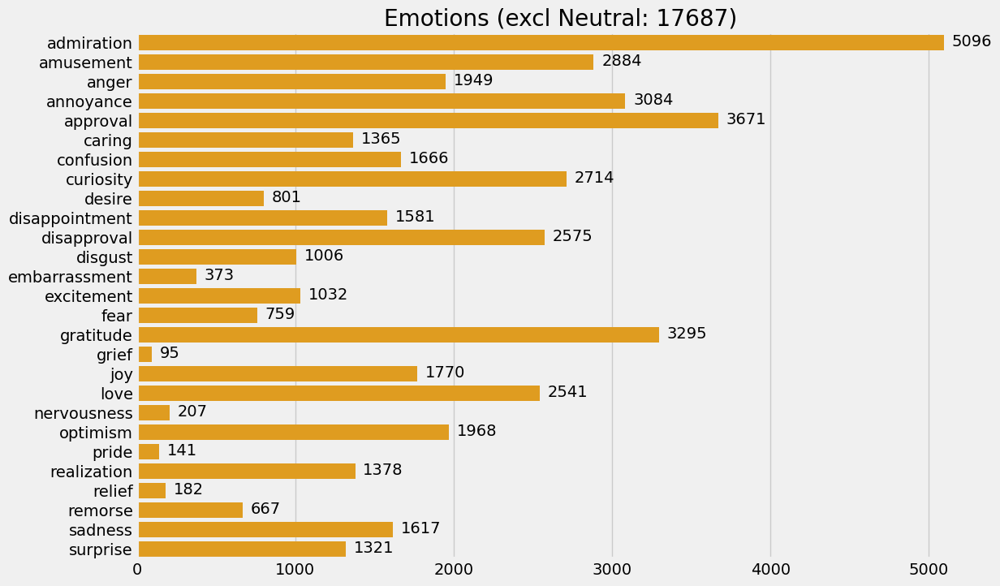

In [10]:
fig, ax = plt.subplots(figsize=(12,8))
data = dfc.sum()
sns.barplot(x=data[:-1].values, y=data[:-1].index, ax=ax, color='orange');

for i, v in enumerate(data[:-1].values):
    ax.text(v + 50, i+0.2, str(v), color='black')

ax.set_title(f'Emotions (excl Neutral: {data[-1]})');
ax.set_ylabel(f'');

In [11]:
print(f'No of emotions per reddit text:\n{dfc.sum(axis=1).value_counts()}')

No of emotions per reddit text:
1    45128
2     8091
3      654
0       40
4       37
5        1
Name: count, dtype: int64


In [12]:
emotions = tuple(dfc.columns)

In [13]:
two_combinations = []

for col1, col2 in combinations(dfc.columns, 2):
    label = f'{col1}-{col2}'
    count = (df[[col1, col2]].sum(axis=1) == 2).sum()
    two_combinations.append([label, count])

# sort by count descending
two_combinations = sorted(two_combinations, key=lambda x: x[1], reverse=True)

len(two_combinations)

378

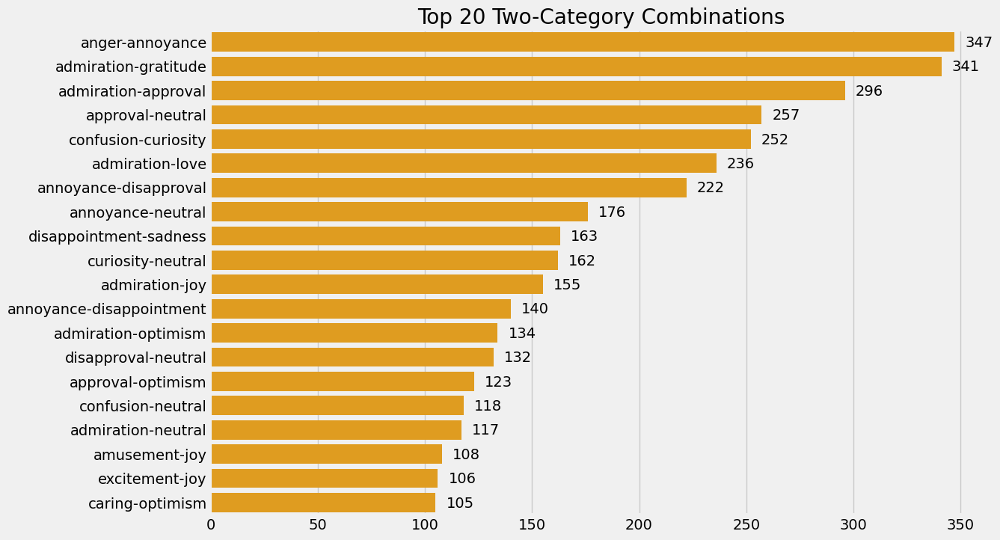

In [14]:
two_combinations_label = [sublist[0] for sublist in two_combinations]
two_combinations_val = [sublist[1] for sublist in two_combinations]

fig, ax = plt.subplots(figsize=(12,8))

sns.barplot(x=two_combinations_val[:20], y=two_combinations_label[:20], ax=ax, color='orange');

for i, v in enumerate(two_combinations_val[:20]):
    ax.text(v + 5, i+0.2, str(v), color='black')

ax.set_title(f'Top 20 Two-Category Combinations');

In [15]:
three_combinations = []

for col1, col2, col3 in combinations(dfc.columns, 3):
    label = f'{col1}-{col2}-{col3}'
    count = (df[[col1, col2, col3]].sum(axis=1) == 3).sum()
    three_combinations.append([label, count])

# sort by count descending
three_combinations = sorted(three_combinations, key=lambda x: x[1], reverse=True)

len(three_combinations)

3276

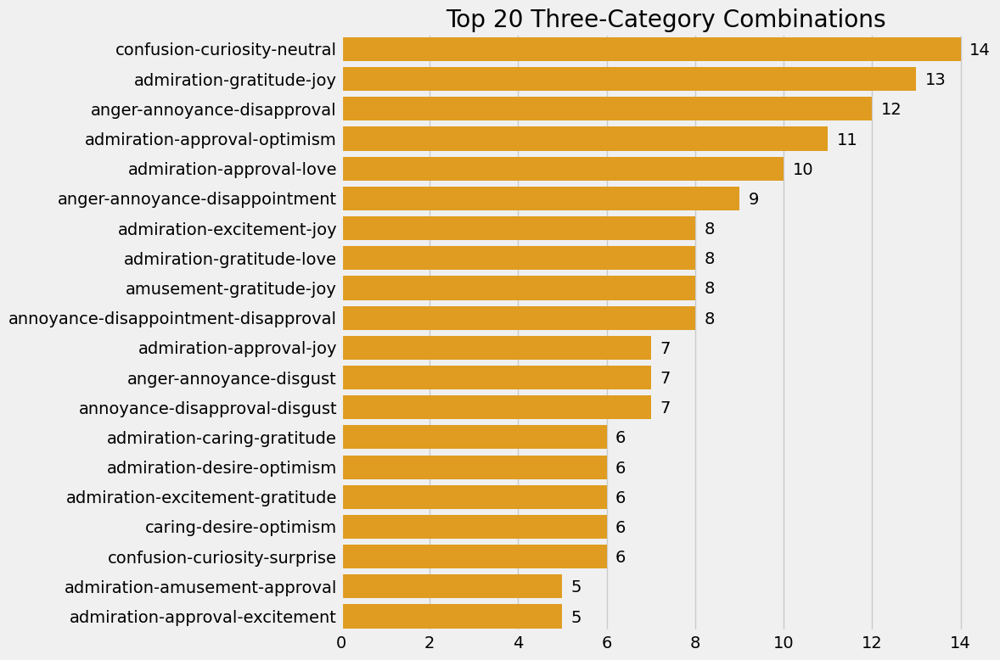

In [16]:
three_combinations_label = [sublist[0] for sublist in three_combinations]
three_combinations_val = [sublist[1] for sublist in three_combinations]

fig, ax = plt.subplots(figsize=(12,8))

sns.barplot(x=three_combinations_val[:20], y=three_combinations_label[:20], ax=ax, color='orange');

for i, v in enumerate(three_combinations_val[:20]):
    ax.text(v + 0.2, i+0.2, str(v), color='black')

ax.set_title(f'Top 20 Three-Category Combinations')

plt.tight_layout()

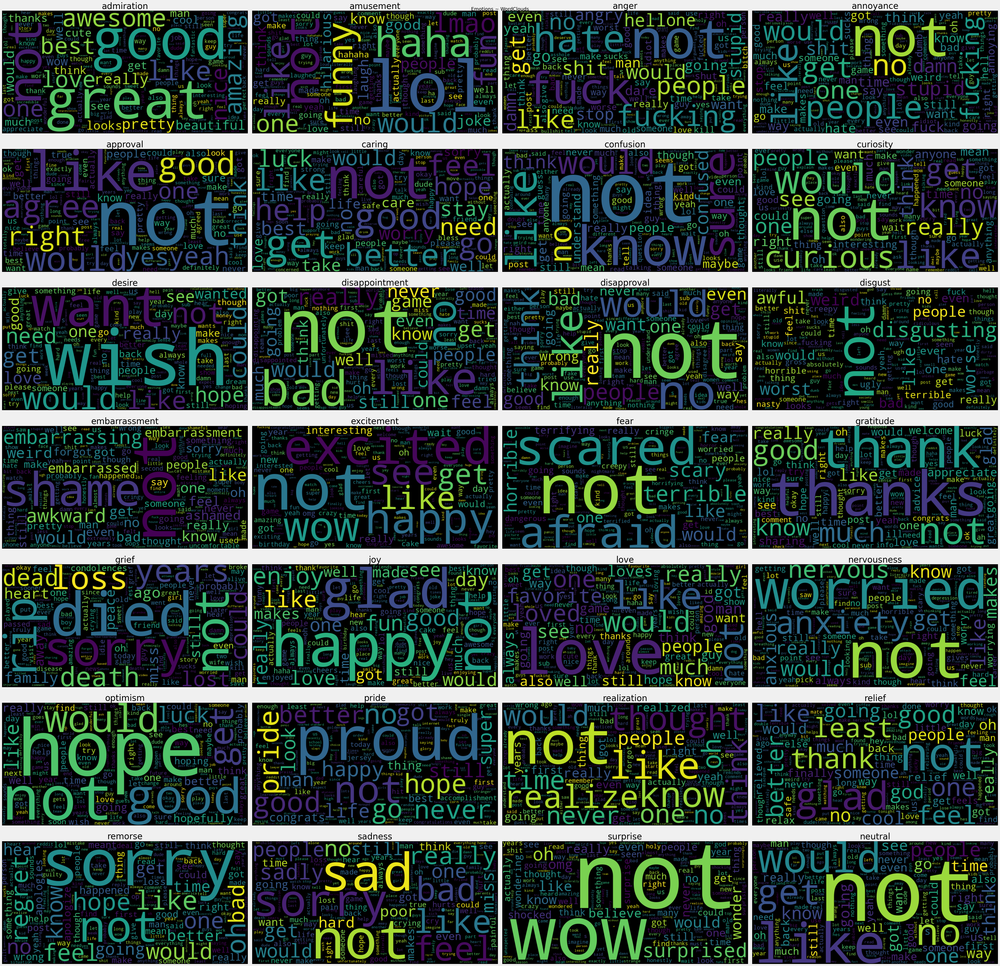

In [17]:
emotions = ['admiration', 'amusement', 'anger', 'annoyance', 'approval', 
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral']
       
all_word_freq = {}
fig, axs = plt.subplots(7, 4, figsize=(49, 48))
for i, emotion in enumerate(emotions):
    dff = df[df[emotion]==1].reset_index(drop=True)
    text = dff['nltk_preprocessed'].apply(lambda x: x.split())
    words = []
    for tweet in text:
        for word in tweet:
            if word!="[NAME]" and word!="[REG]" and word!="[NUM]":
                words.append(word)

    word_freq = Counter(words)
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate_from_frequencies(word_freq)

    # Display the WordCloud using matplotlib
    axs[i//4][i%4].set_title(emotion, fontsize=30)
    axs[i//4][i%4].imshow(wordcloud, interpolation='bilinear')
    axs[i//4][i%4].axis('off')

plt.suptitle('Emotions ~ WordClouds')
plt.tight_layout()

In [29]:
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)
output = tokenizer.encode_plus('hello my name is nitthesh')